The codes for split it to traning, testing, validating are available at utility/mat_data.py create_WDC_dataset(). 

Run the createDCmall() function in utility/lmdb_data.py to generate training lmdb dataset. 

To generate testing files with noise, replace the srcdir and dstdir in utility/generate_case.py and run utility/generate_case.py.

In [2]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import scipy.io
import xarray as xr
import rasterio
from rasterio.transform import from_origin
from hypso import Hypso1

In [ ]:
# Define HYPSO Image File and the .points from QGIS (if available)
dir_path = './data/HSI_Data/Hyperspectral_Project/HYPSO/'
image_name= 'virginiabeach_2024-08-22T14-59-41Z-l1a'

l1a_nc_file = os.path.join(dir_path, image_name, '.nc')
points_file = os.path.join(dir_path, 'sift-bin.points')

# Create Satellite Object
satobj = Hypso1(path=l1a_nc_file, verbose=True)
satobj.load_points_file(path=points_file, image_mode='standard', origin_mode='qgis')
satobj.generate_georeferencing()
satobj.generate_geometry()
l1a_cube = satobj.get_l1a_cube()
l1a_cube
# Get the dimensions and coordinates
height, width, bands = l1a_cube.shape

transform = from_origin(l1a_cube.coords['x'][0], l1a_cube.coords['y'][0], 1, 1)

# Define the output GeoTIFF file path
output_tif = l1a_nc_file = os.path.join(dir_path, image_name, '.tif')


# Save the xarray object as a GeoTIFF file
with rasterio.open(
    output_tif,
    'w',
    driver='GTiff',
    height=height,
    width=width,
    count=bands,
    dtype=l1a_cube.dtype,
    crs='+proj=latlong',
    transform=transform,
) as dst:
    for i in range(bands):
        dst.write(l1a_cube[:, :, i], i + 1)

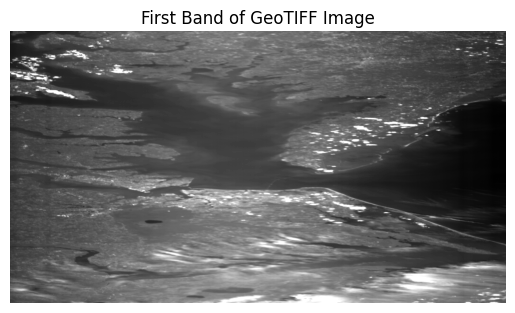

In [62]:
# Open the GeoTIFF file
with rasterio.open(output_tif) as src:
    # Read the first band
    first_band = src.read(50)
    
    # Plot the first band
    plt.imshow(first_band, cmap='gray')
    plt.title('First Band of GeoTIFF Image')
    plt.axis('off')
    plt.show()

In [ ]:
# Define the path to the updated Virginia Beach GeoTIFF file
updated_vb_tif_path = './data/HSI_Data/Hyperspectral_Project/HYPSO/virginiabeach_2024-08-22T14-59-41Z-l1a_updated.tif'

# Open the dc.tif file and the original Virginia Beach GeoTIFF file
with rasterio.open(dc_tif_path) as dc_src, rasterio.open(vb_tif_path) as vb_src:
    # Read the metadata of each image
    dc_metadata = dc_src.meta
    vb_metadata = vb_src.meta
    
    # Update the Virginia Beach metadata to match DC metadata, except for width, height, and count
    vb_metadata.update({
        key: value for key, value in dc_metadata.items() if key not in ['width', 'height', 'count']
    })
    
    # Save the updated Virginia Beach GeoTIFF file with the new metadata
    with rasterio.open(
        updated_vb_tif_path,
        'w',
        **vb_metadata
    ) as dst:
        for i in range(1, vb_src.count + 1):
            dst.write(vb_src.read(i), i)
    
    # Plot the metadata of each image side by side
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))
    
    axes[0].imshow(dc_src.read(1), cmap='gray')
    axes[0].set_title('First Band of DC GeoTIFF Image')
    axes[0].axis('off')
    
    axes[1].imshow(vb_src.read(1), cmap='gray')
    axes[1].set_title('First Band of Virginia Beach GeoTIFF Image')
    axes[1].axis('off')
    
    plt.show()
    
    # Print metadata
    print("DC GeoTIFF Metadata:")
    for key, value in dc_metadata.items():
        print(f"{key}: {value}")
    
    print("\nVirginia Beach GeoTIFF Metadata (Updated):")
    for key, value in vb_metadata.items():
        print(f"{key}: {value}")

In [11]:
%run ./utility/mat_data.py

The shape of imggt is: torch.Size([120, 598, 1092])
The shape of imggt2 is: (191, 1280, 307)


In [13]:
%run  ./utility/lmdb_data.py

create HYPSO...
Total data size (GB): 0.1942884922027588
Map size (GB): 5.828654766082764
(0, 191, 64, 64)
map size (GB): 0.0
name: /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/hypso.db
load mat (0/2): train_0.mat
load mat (1/2): train_1.mat
done


In [18]:
%run  ./utility/generate_case.py

1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case2 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case3 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test/test.mat
1
/home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case4 /home/lofty/CODE/HyperSIGMA-fork/ImageDenoising/data/HSI_Data/Hyperspectral_Project/HYPSO/test/test.mat


In [44]:
def plot_rgb_composite(path, keys, red_band=60, green_band=30, blue_band=10):
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 3D arrays using the provided keys
    rgb_images = []
    for key in keys:
        array = data[key]
        if key == 'data' or key == 'gt':
            red = array[red_band, :, :]
            green = array[green_band, :, :]
            blue = array[blue_band, :, :]
        else:
            red = array[:, :, red_band]
            green = array[:, :, green_band]
            blue = array[:, :, blue_band]
        rgb_image = np.stack((red, green, blue), axis=-1)
        rgb_images.append(rgb_image)
    
    # Plot the images side by side
    if len(rgb_images) == 1:
        plt.imshow(rgb_images[0])
        plt.title(f'{keys[0]}')
        plt.axis('off')
    else:
        fig, axes = plt.subplots(1, len(rgb_images), figsize=(15, 5))
        for ax, rgb_image, key in zip(axes, rgb_images, keys):
            ax.imshow(rgb_image)
            ax.set_title(f'{key}')
            ax.axis('off')
    
    plt.show()

In [42]:
wdc_test = './data/HSI_Data/Hyperspectral_Project/WDC/test/test.mat'
hypso_test = './data/HSI_Data/Hyperspectral_Project/HYPSO/test/test.mat'
wdc_test_case='./data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case2/test.mat'
hypso_test_case='./data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case2/test.mat'
# Load the .mat files
wdc_data = scipy.io.loadmat(wdc_test)
hypso_data = scipy.io.loadmat(hypso_test)
wdc_case_data = scipy.io.loadmat(wdc_test_case)
hypso_case_data = scipy.io.loadmat(hypso_test_case)

# BEGIN: shape of wdc case data and hypso case data
wdc_case_shape = wdc_case_data['gt'].shape
hypso_case_shape = hypso_case_data['gt'].shape

print("Shape of WDC case data:", wdc_case_shape)
print("Shape of HYPSO case data:", hypso_case_shape)
# END:

Shape of WDC case data: (191, 192, 192)
Shape of HYPSO case data: (120, 192, 192)


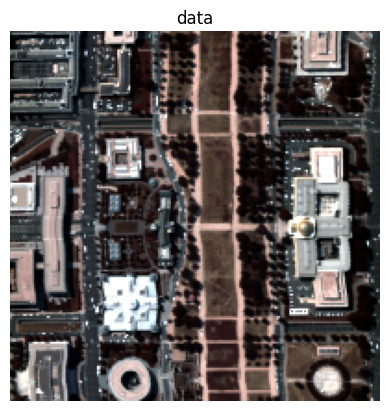

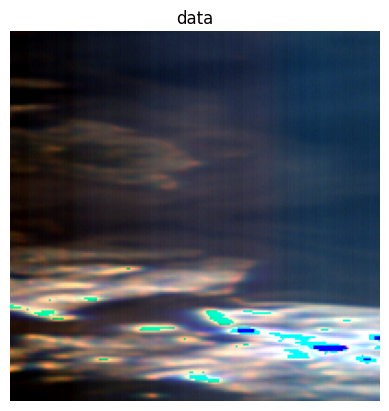

In [45]:
plot_rgb_composite(
    wdc_test,
    keys=['data'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    hypso_test,
    keys=['data'],
    red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.109945771259656..2.0987761525814737].


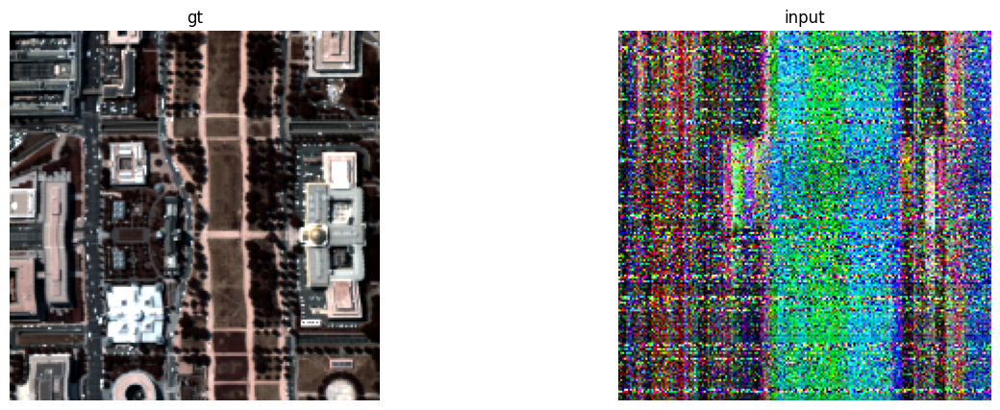

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2018960997277537..2.252931318120502].


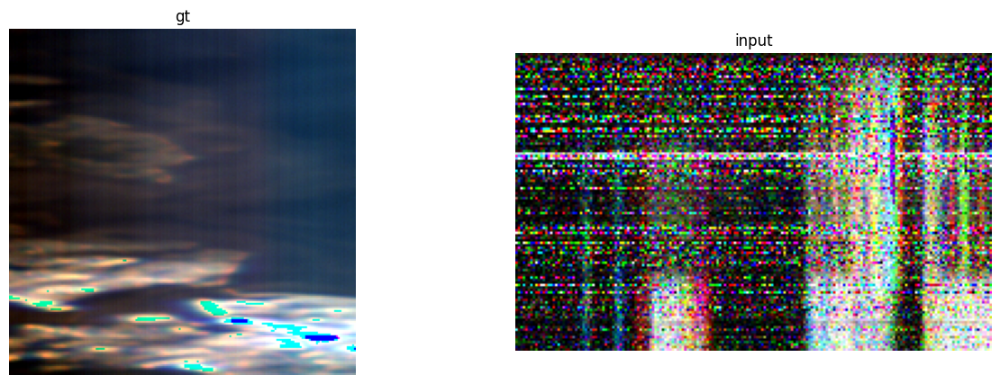

In [46]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/test_noise/Cases/Case4/test.mat',
    keys=['gt','input'],
     red_band=30, green_band=20, blue_band=10
)
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/HYPSO/test_noise/Cases/Case4/test.mat',
    keys=['gt','input'],
    red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3754329681396484..2.211869955062866].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13894705474376678..1.1239591836929321].


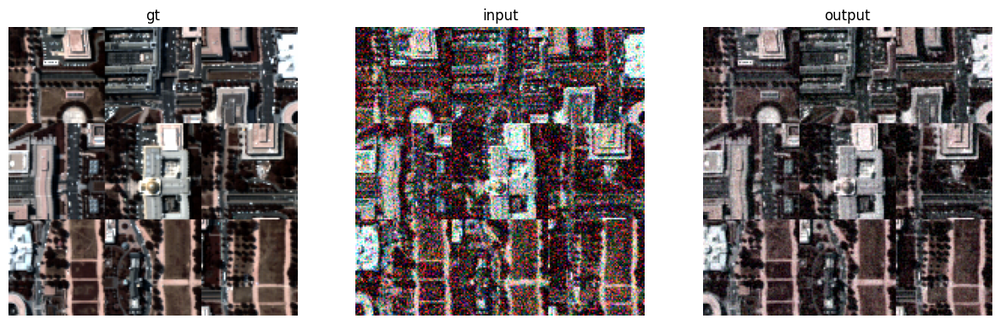

In [39]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case2.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.6852670311927795..1.6641799211502075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14515969157218933..1.1071648597717285].


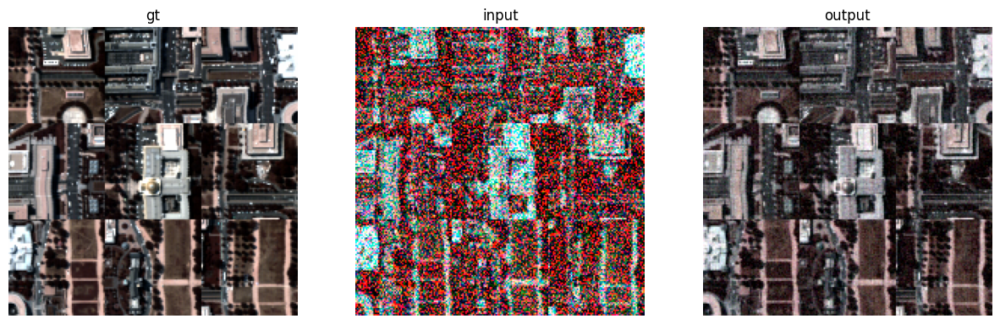

In [30]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case3.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.3295655250549316..2.040834903717041].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1464952528476715..1.135345697402954].


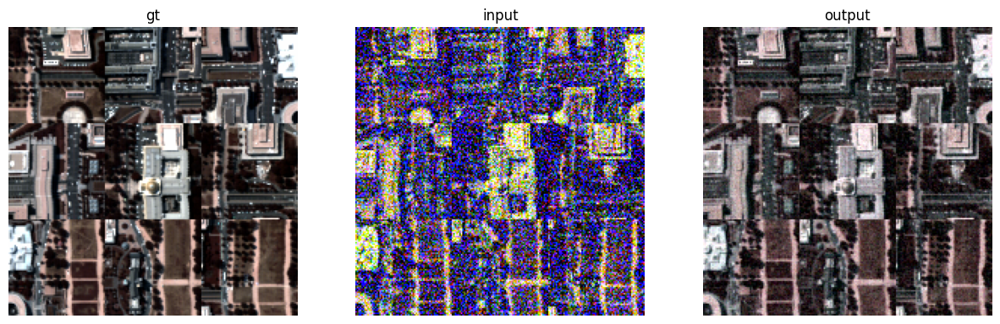

In [31]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case4.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.225819706916809..2.1702232360839844].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11813962459564209..1.1199982166290283].


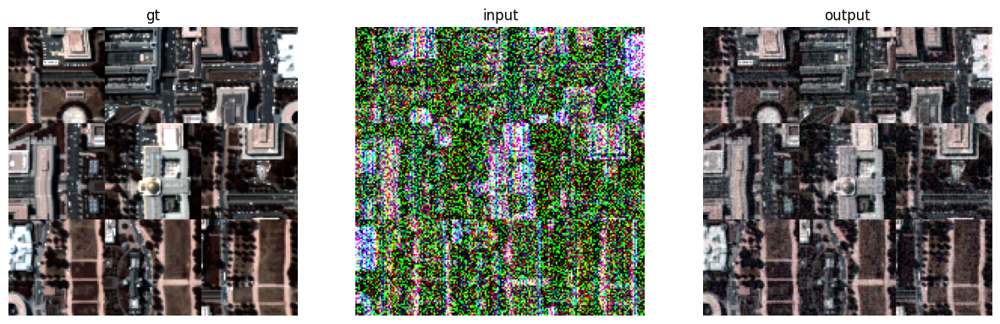

In [32]:
plot_rgb_composite(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    keys=['gt', 'input', 'output'],
     red_band=30, green_band=20, blue_band=10
)

In [12]:
"""
- Common colormaps include: 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'gray', 'hot', 'cool', 'spring', 'summer', 'autumn', 'winter'.
"""
def plot_hyperspectral_images_with_keys(path, keys, band=0):
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 3D arrays using the provided keys
    arrays = [data[key] for key in keys]
    
    # Extract the specified band (assuming the third dimension is the spectral dimension)
    bands = [array[:, :, band] for array in arrays]
    
    # Plot the images side by side
    fig, axes = plt.subplots(1, len(bands), figsize=(15, 5))
    
    for ax, band, key in zip(axes, bands, keys):
        ax.imshow(band, cmap='viridis')
        ax.imshow(band, cmap='viridis', alpha=0)
        ax.set_title(f'{key}')
        ax.axis('off')
    plt.show()

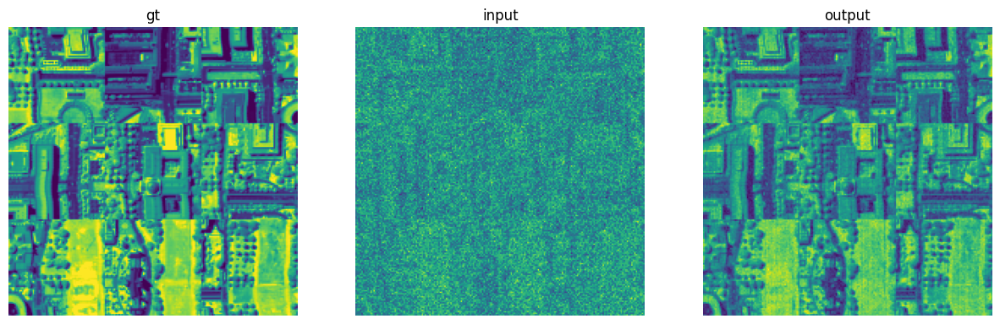

In [13]:
plot_hyperspectral_images_with_keys(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    keys=['gt', 'input', 'output'],
    band=60  # Change this value to plot a different band
)

In [22]:
def plot_hyperspectral_output(path, num_rows=3, num_cols=4, cmap='plasma'):
    """
    - Common colormaps include: 'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'gray', 'hot', 'cool', 'spring', 'summer', 'autumn', 'winter'.
    """
    # Load the .mat file
    data = scipy.io.loadmat(path)
    
    # Extract the 'output' key
    output_data = data['output']
    
    # Plot the output data for 12 bands with equal spacing
    num_bands = output_data.shape[2]
    num_plots = num_rows * num_cols
    spacing = num_bands // num_plots
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 15))
    
    for i, ax in enumerate(axes.flat):
        band_index = i * spacing
        if band_index < num_bands:
            ax.imshow(output_data[:, :, band_index], cmap=cmap)
            ax.set_title(f'Output of {path.split("/")[-1]} - Band {band_index}')
            ax.axis('off')
        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

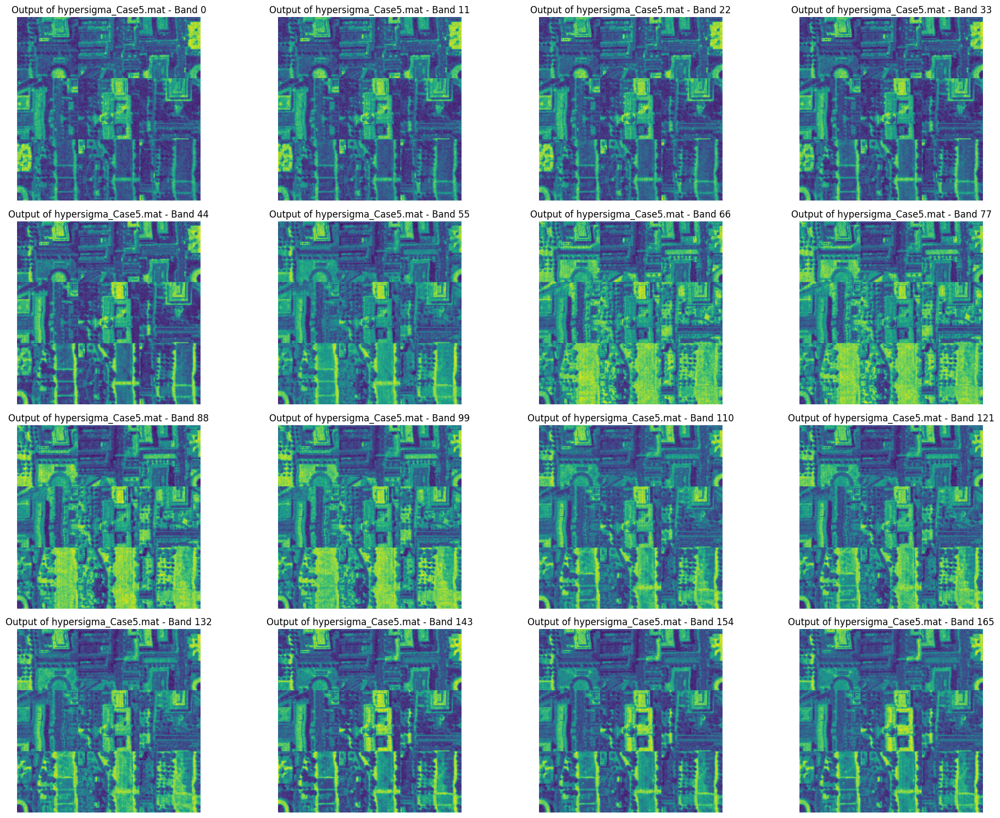

In [27]:
# Example usage
plot_hyperspectral_output(
    './data/HSI_Data/Hyperspectral_Project/WDC/results/hypersigma/hypersigma_Case5.mat',
    num_rows=4, num_cols=4, cmap='viridis'
)